In [1]:
!mamba install -yq python-dotenv plotly

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
cali_house_prices = pd.read_csv("data/california_housing_prices.csv")
cali_house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [4]:
# median_income is initially measured in 10s of thousands, convert to dollars
# cali_house_prices["median_income"] = cali_house_prices["median_income"] * 10000

In [5]:
# Convert median_house_value to units of 100s of thousands of dollars
cali_house_prices['median_house_value'] = cali_house_prices['median_house_value'] / 100000

In [6]:
def convert_dollars_2022(dollars):
    # According to https://www.officialdata.org/us/inflation/1990?endYear=2022&amount=1
    conversion = 2.24
    return dollars * conversion

In [7]:
# Convert income and value to 2022 dollars
cali_house_prices["income_2022_dollars"] = cali_house_prices["median_income"].apply(convert_dollars_2022)
cali_house_prices["value_2022_dollars"] = cali_house_prices["median_house_value"].apply(convert_dollars_2022)

In [8]:
cali_house_prices.rename(columns={
    "median_house_value": "value"
}, inplace=True)

cali_house_prices.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,4.526,NEAR BAY,18.648448,10.13824
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.585,NEAR BAY,18.595136,8.03040
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.521,NEAR BAY,16.256576,7.88704
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.413,NEAR BAY,12.640544,7.64512
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.422,NEAR BAY,8.615488,7.66528


In [9]:
# Convert latitude and longitude into csv pair
cali_house_prices["lat_long_pair"] = cali_house_prices["latitude"].astype(str) + "," + cali_house_prices["longitude"].astype(str)
cali_house_prices["lat_long_pair"]

0        37.88,-122.23
1        37.86,-122.22
2        37.85,-122.24
3        37.85,-122.25
4        37.85,-122.25
             ...      
20635    39.48,-121.09
20636    39.49,-121.21
20637    39.43,-121.22
20638    39.43,-121.32
20639    39.37,-121.24
Name: lat_long_pair, Length: 20640, dtype: object

In [10]:
# To-Do: Revisit this function, want to return lat,lng with .1 precision
def reduce_lat_long(string):
    """
    Reduces latitude and longitude string pair by one decimal point each
    """
    latlng = string.split(",")
    lat = latlng[0]
    lng = latlng[1]

    lat = lat[:len(lat)]
    lng = lng[:len(lng)]
    return lat + "," + lng


In [11]:
# Reduce unique lat long pairs for calling geocode API for city info
cali_house_prices["lat_long_pair"] = cali_house_prices["lat_long_pair"].map(reduce_lat_long)

In [12]:
lat_long = cali_house_prices["lat_long_pair"].value_counts()

lat_long.to_frame()

,count
lat_long_pair,
"37.8,-122.41",15
"37.78,-122.44",11
"37.8,-122.42",11
"37.77,-122.43",10
"37.79,-122.44",10
...,...
"38.29,-122.32",1
"38.29,-122.33",1
"38.28,-122.3",1


In [13]:
# To-Do: Actually use this once the lat_long_pair has been correctly reduced in precision
import requests
import os
from dotenv import load_dotenv

# Requires API key "GEOCODE_API_KEY" set in .env for Google Maps Geocode API
load_dotenv()
API_KEY = os.getenv("GEOCODE_API_KEY")

def get_city(lat_long):
    """
    Given lat long csv pair, returns city or locality from Google Maps Geocode API
    """
    api_key = ""
    res = requests.get(f"https://maps.googleapis.com/maps/api/geocode/json?key={api_key}&latlng={lat_long}&result_type=locality")
    res = res.json()
    return res["results"][0]["address_components"][0]["short_name"]


## Model evaluation code

In [14]:
# Full dataframe for modeling
df = cali_house_prices
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,value,ocean_proximity,income_2022_dollars,value_2022_dollars,lat_long_pair
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,4.526,NEAR BAY,18.648448,10.13824,"37.88,-122.23"
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,3.585,NEAR BAY,18.595136,8.03040,"37.86,-122.22"
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,3.521,NEAR BAY,16.256576,7.88704,"37.85,-122.24"
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,3.413,NEAR BAY,12.640544,7.64512,"37.85,-122.25"
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,3.422,NEAR BAY,8.615488,7.66528,"37.85,-122.25"


In [15]:
data = df[~df.isna().any(axis=1)].copy()

In [16]:
# Model evaluation code adapted from Dr. Homayouni
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# Phi is the feature engineering function
def evaluate_model(name, model, phi, models=dict()):
    # run the prediction function and compute the RMSE
    Yhat = model.predict(phi(data)).flatten()
    Y = data['value_2022_dollars'].to_numpy()
    rmse = np.sqrt(mean_squared_error(Y, Yhat))
    print("Root Mean Squared Error:", rmse)

    # Save the model and rmse to the collection of models
    models[name] = dict(model=model, phi=phi, rmse=rmse)

    # Generate diagnostic and model comparison plots
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(go.Scatter(x=Yhat, y=Y, mode="markers"), row=1, col=1)
    fig.update_xaxes(title = "Yhat", row=1, col=1)
    fig.update_yaxes(title = "Y", row=1, col=1)
    ymin = np.min(Yhat)
    ymax = np.max(Yhat)
    fig.add_trace(go.Scatter(x=[ymin,ymax], y=[ymin,ymax], name="y=yhat"), row=1, col=1)
    fig.add_trace(go.Bar(x=list(models.keys()),
                         y=[models[k]['rmse'] for k in models]), row=1, col=2)
    fig.update_layout(showlegend=False)
    fig.update_yaxes(title = "RMSE", row=1, col=2)
    fig.show()



models = {}

In [17]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income', 'value',
       'ocean_proximity', 'income_2022_dollars', 'value_2022_dollars',
       'lat_long_pair'],
      dtype='object')

## Basic linear model on qunatitative data

In [18]:
# Basic matrix adapted from Dr. Homayouni
def basic_design_matrix(df):
    X = df[['housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'income_2022_dollars']]
    return X

basic_design_matrix(data)

,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars
0,41.0,880.0,129.0,322.0,126.0,18.648448
1,21.0,7099.0,1106.0,2401.0,1138.0,18.595136
2,52.0,1467.0,190.0,496.0,177.0,16.256576
3,52.0,1274.0,235.0,558.0,219.0,12.640544
4,52.0,1627.0,280.0,565.0,259.0,8.615488
...,...,...,...,...,...,...
20635,25.0,1665.0,374.0,845.0,330.0,3.495072
20636,18.0,697.0,150.0,356.0,114.0,5.727232
20637,17.0,2254.0,485.0,1007.0,433.0,3.808000
20638,18.0,1860.0,409.0,741.0,349.0,4.182528


In [19]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(basic_design_matrix(data), data['value_2022_dollars'])
evaluate_model("basic", model, basic_design_matrix, models)

Root Mean Squared Error: 1.7019637034128232


## Non-linear transformations on quantitative data

In [20]:
# Borrowed from Dr. Homayouni
def nonlinear_design_matrix(df):
    X = basic_design_matrix(df)
    # Compute nonlinear transformations for each quantitative feature
    for col in X.columns:
        X[f'{col}^2'] = X[f'{col}'] ** 2
        X[f'{col}^3'] = X[f'{col}'] ** 3
        X[f'log({col})'] = np.log(X[f'{col}'])
        X[f'sin({col})'] = np.sin(X[f'{col}'])
    return X

nonlinear_design_matrix(data)

,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,log(housing_median_age),sin(housing_median_age),...,log(population),sin(population),households^2,households^3,log(households),sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars)
0,41.0,880.0,129.0,322.0,126.0,18.648448,1681.0,68921.0,3.713572,-0.158623,...,5.774552,0.999912,15876.0,2.000376e+06,4.836282,0.329991,347.764613,6485.270298,2.925763,-0.199755
1,21.0,7099.0,1106.0,2401.0,1138.0,18.595136,441.0,9261.0,3.044522,0.836656,...,7.783641,0.733334,1295044.0,1.473760e+09,7.037028,0.676839,345.779083,6429.809072,2.922900,-0.251684
2,52.0,1467.0,190.0,496.0,177.0,16.256576,2704.0,140608.0,3.951244,0.986628,...,6.206576,-0.363143,31329.0,5.545233e+06,5.176150,0.877590,264.276263,4296.227158,2.788498,-0.521504
3,52.0,1274.0,235.0,558.0,219.0,12.640544,2704.0,140608.0,3.951244,0.986628,...,6.324359,-0.933299,47961.0,1.050346e+07,5.389072,-0.790415,159.783353,2019.748499,2.536909,0.074105
4,52.0,1627.0,280.0,565.0,259.0,8.615488,2704.0,140608.0,3.951244,0.986628,...,6.336826,-0.467692,67081.0,1.737398e+07,5.556828,0.983593,74.226633,639.498670,2.153562,0.723797
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,25.0,1665.0,374.0,845.0,330.0,3.495072,625.0,15625.0,3.218876,-0.132352,...,6.739337,0.088309,108900.0,3.593700e+07,5.799093,-0.132382,12.215528,42.694151,1.251354,-0.346164
20636,18.0,697.0,150.0,356.0,114.0,5.727232,324.0,5832.0,2.890372,-0.750987,...,5.874931,-0.841487,12996.0,1.481544e+06,4.736198,0.784980,32.801186,187.860004,1.745232,-0.527753
20637,17.0,2254.0,485.0,1007.0,433.0,3.808000,289.0,4913.0,2.833213,-0.961397,...,6.914731,0.992862,187489.0,8.118274e+07,6.070738,-0.513953,14.500864,55.219290,1.337104,-0.618166
20638,18.0,1860.0,409.0,741.0,349.0,4.182528,324.0,5832.0,2.890372,-0.750987,...,6.608001,-0.403982,121801.0,4.250855e+07,5.855072,-0.279444,17.493540,73.167223,1.430916,-0.862877


In [21]:
model = LinearRegression()
model.fit(nonlinear_design_matrix(data), data['value_2022_dollars'])
evaluate_model("nonlinear", model, nonlinear_design_matrix, models)

Root Mean Squared Error: 1.557166053117765


## Qualitative Data

In [22]:
px.histogram(data, x='ocean_proximity')

In [23]:
# Adapted from Dr. Homayouni
from sklearn.preprocessing import OneHotEncoder
oh_enc = OneHotEncoder()
oh_enc.fit_transform(data[['ocean_proximity']]).toarray()

array([[0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       [0., 0., 0., 1., 0.],
       ...,
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [24]:
enc_data=pd.DataFrame(oh_enc.fit_transform(data[['ocean_proximity']]).toarray())
enc_data

,0,1,2,3,4
0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...
20428,0.0,1.0,0.0,0.0,0.0
20429,0.0,1.0,0.0,0.0,0.0
20430,0.0,1.0,0.0,0.0,0.0
20431,0.0,1.0,0.0,0.0,0.0


In [25]:
#Merge with main data using a function
def sklearn_ohe_design_matrix(X):
    X=nonlinear_design_matrix(X)
    ohe_cols = pd.DataFrame(oh_enc.transform(df[['ocean_proximity']]).todense(),
                           columns=oh_enc.get_feature_names_out(),
                           index = df.index)
    return X.join(ohe_cols)

sklearn_ohe_design_matrix(data)

,housing_median_age,total_rooms,total_bedrooms,population,households,income_2022_dollars,housing_median_age^2,housing_median_age^3,log(housing_median_age),sin(housing_median_age),...,sin(households),income_2022_dollars^2,income_2022_dollars^3,log(income_2022_dollars),sin(income_2022_dollars),ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,41.0,880.0,129.0,322.0,126.0,18.648448,1681.0,68921.0,3.713572,-0.158623,...,0.329991,347.764613,6485.270298,2.925763,-0.199755,0.0,0.0,0.0,1.0,0.0
1,21.0,7099.0,1106.0,2401.0,1138.0,18.595136,441.0,9261.0,3.044522,0.836656,...,0.676839,345.779083,6429.809072,2.922900,-0.251684,0.0,0.0,0.0,1.0,0.0
2,52.0,1467.0,190.0,496.0,177.0,16.256576,2704.0,140608.0,3.951244,0.986628,...,0.877590,264.276263,4296.227158,2.788498,-0.521504,0.0,0.0,0.0,1.0,0.0
3,52.0,1274.0,235.0,558.0,219.0,12.640544,2704.0,140608.0,3.951244,0.986628,...,-0.790415,159.783353,2019.748499,2.536909,0.074105,0.0,0.0,0.0,1.0,0.0
4,52.0,1627.0,280.0,565.0,259.0,8.615488,2704.0,140608.0,3.951244,0.986628,...,0.983593,74.226633,639.498670,2.153562,0.723797,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,25.0,1665.0,374.0,845.0,330.0,3.495072,625.0,15625.0,3.218876,-0.132352,...,-0.132382,12.215528,42.694151,1.251354,-0.346164,0.0,1.0,0.0,0.0,0.0
20636,18.0,697.0,150.0,356.0,114.0,5.727232,324.0,5832.0,2.890372,-0.750987,...,0.784980,32.801186,187.860004,1.745232,-0.527753,0.0,1.0,0.0,0.0,0.0
20637,17.0,2254.0,485.0,1007.0,433.0,3.808000,289.0,4913.0,2.833213,-0.961397,...,-0.513953,14.500864,55.219290,1.337104,-0.618166,0.0,1.0,0.0,0.0,0.0
20638,18.0,1860.0,409.0,741.0,349.0,4.182528,324.0,5832.0,2.890372,-0.750987,...,-0.279444,17.493540,73.167223,1.430916,-0.862877,0.0,1.0,0.0,0.0,0.0


Root Mean Squared Error: 5.093453836269424


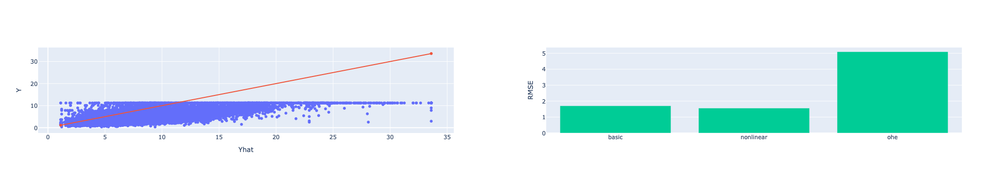

In [26]:
model = LinearRegression()
model.fit(sklearn_ohe_design_matrix(data), data['income_2022_dollars'])
evaluate_model("ohe", model, sklearn_ohe_design_matrix, models)